In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
df = pd.read_csv('/content/povpred.csv')
df.head()

,country,is_urban,age,female,married,religion,relationship_to_hh_head,education_level,literate,can_add,...,has_investment,bank_interest_rate,borrowed_for_emergency_last_year,borrowed_for_daily_expenses_last_year,borrowed_for_home_or_biz_last_year,can_call_viaphone,can_text_viaphone,can_use_internet_viaphone,active_bank_user,poverty_probability
0,C,False,18,True,True,P,Other,1.0,True,True,...,False,NaN,False,False,False,True,True,False,True,0.515
1,C,True,30,True,True,P,Other,1.0,True,True,...,False,NaN,False,False,False,True,False,False,True,0.981
2,A,False,20,True,True,Q,Spouse,1.0,True,True,...,False,NaN,False,False,False,True,False,False,False,0.982
3,A,False,61,False,True,Q,Head,0.0,False,True,...,False,NaN,False,False,False,True,False,False,False,0.879
4,D,False,26,True,True,X,Spouse,1.0,True,False,...,False,NaN,False,False,False,True,True,False,False,0.796


In [ ]:
df.shape

(12600, 32)

In [ ]:
df.columns

Index(['country', 'is_urban', 'age', 'female', 'married', 'religion',
       'relationship_to_hh_head', 'education_level', 'literate', 'can_add',
       'can_divide', 'employed_last_year', 'employment_category_last_year',
       'employment_type_last_year', 'income_own_business_last_year',
       'income_private_sector_last_year', 'income_public_sector_last_year',
       'num_times_borrowed_last_year', 'borrowing_recency', 'formal_savings',
       'informal_savings', 'has_insurance', 'has_investment',
       'bank_interest_rate', 'borrowed_for_emergency_last_year',
       'borrowed_for_daily_expenses_last_year',
       'borrowed_for_home_or_biz_last_year', 'can_call_viaphone',
       'can_text_viaphone', 'can_use_internet_viaphone', 'active_bank_user',
       'poverty_probability'],
      dtype='object')

In [ ]:
df = df.drop_duplicates(subset=['country', 'is_urban', 'age', 'female', 'married', 'religion',
       'relationship_to_hh_head', 'education_level', 'literate', 'can_add',
       'can_divide', 'employed_last_year', 'employment_category_last_year',
       'employment_type_last_year', 'income_own_business_last_year',
       'income_private_sector_last_year', 'income_public_sector_last_year',
       'num_times_borrowed_last_year', 'borrowing_recency', 'formal_savings',
       'informal_savings', 'has_insurance', 'has_investment',
       'bank_interest_rate', 'borrowed_for_emergency_last_year',
       'borrowed_for_daily_expenses_last_year',
       'borrowed_for_home_or_biz_last_year', 'can_call_viaphone',
       'can_text_viaphone', 'can_use_internet_viaphone', 'active_bank_user',
       'poverty_probability'])

<Axes: xlabel='is_urban', ylabel='count'>

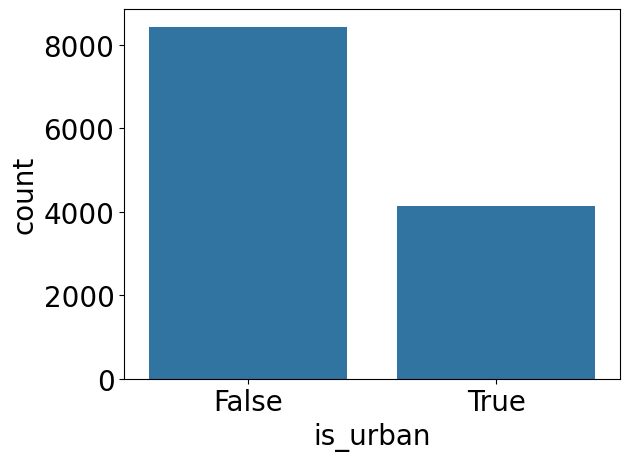

In [ ]:
sns.countplot(data=df, x='is_urban')

In [ ]:
df.shape

(12575, 32)

<Axes: >

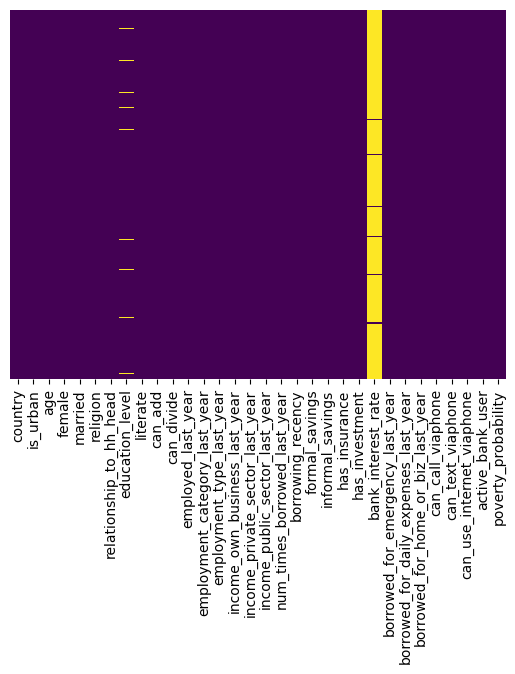

In [ ]:
sns.heatmap(df.isnull(), yticklabels=False, cbar=False, cmap='viridis')

In [ ]:
df1 = df.drop('bank_interest_rate', axis=1)

In [ ]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12575 entries, 0 to 12599
Data columns (total 31 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   country                                12575 non-null  object 
 1   is_urban                               12575 non-null  bool   
 2   age                                    12575 non-null  int64  
 3   female                                 12575 non-null  bool   
 4   married                                12575 non-null  bool   
 5   religion                               12575 non-null  object 
 6   relationship_to_hh_head                12575 non-null  object 
 7   education_level                        12339 non-null  float64
 8   literate                               12575 non-null  bool   
 9   can_add                                12575 non-null  bool   
 10  can_divide                             12575 non-null  bool   
 11  employe

<Axes: xlabel='income_private_sector_last_year', ylabel='count'>

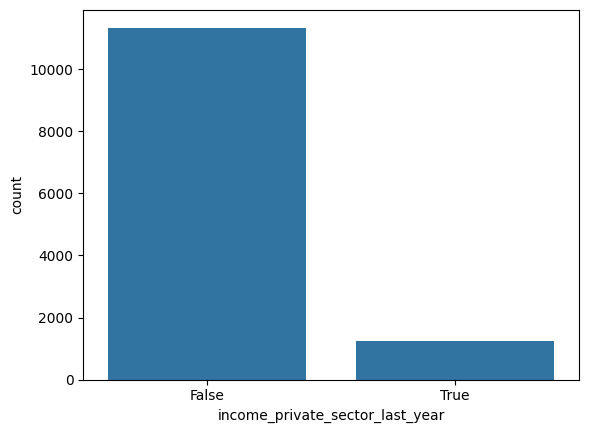

In [ ]:
sns.countplot(data=df, x='income_private_sector_last_year', legend=True)

<Axes: xlabel='income_public_sector_last_year', ylabel='count'>

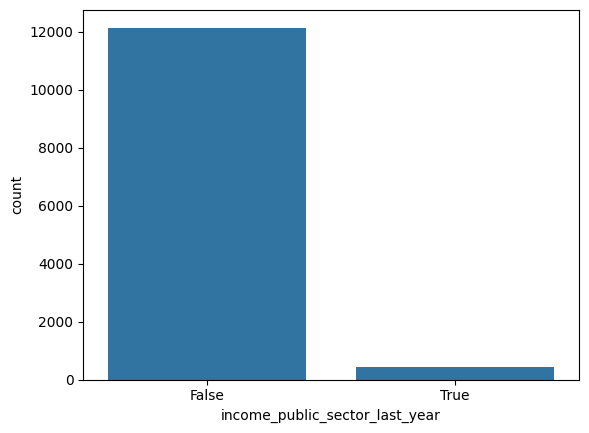

In [ ]:
sns.countplot(data=df,  x='income_public_sector_last_year', legend=True)

<Axes: xlabel='religion', ylabel='count'>

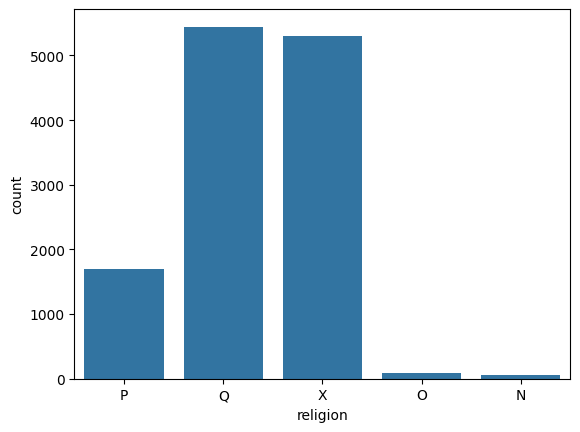

In [ ]:
sns.countplot(data=df,  x='religion', legend=True)

In [ ]:
#create df2: no outlier, imputed educ level

df2 = df1.copy()

<Axes: >

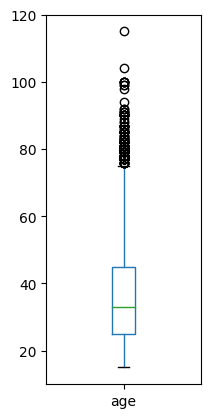

In [ ]:
plt.figure().set_figwidth(2)
df2.boxplot('age', grid=False)

In [ ]:
#remove outlier

def remove_outlier(df2, column):

  Q1c=df2[column].quantile(0.25)
  Q3c=df2[column].quantile(0.75)

  print('1stQ: ',Q1c, ' 2ndQ: ',Q3c)

  IQRc = Q3c-Q1c
  l = Q1c-1.5*IQRc
  h = Q3c+1.5*IQRc

  print(df2.shape, l, h)
  data1 = df2[(df2[column] >l)&(df2[column] < h)]

  return data1

In [ ]:
df2 = remove_outlier(df2, 'age')

1stQ:  25.0  2ndQ:  45.0
(12575, 31) -5.0 75.0


In [ ]:
df2.shape

(12344, 31)

<Axes: >

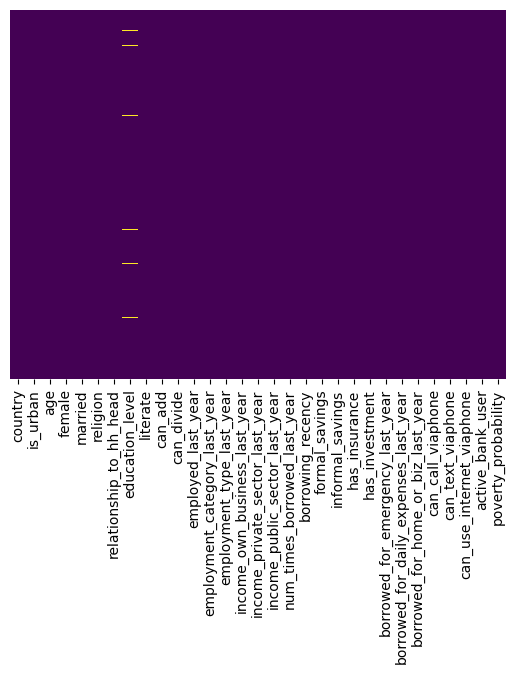

In [ ]:
sns.heatmap(df2.isnull(), yticklabels=False, cbar=False, cmap='viridis')

In [ ]:
#impute educ level with median

df2['education_level'] = df2['education_level'].fillna(df2['education_level'].median())

<Axes: >

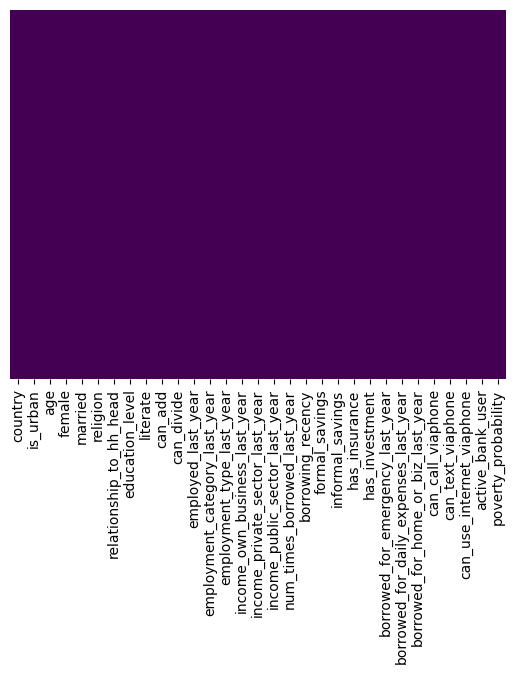

In [ ]:
sns.heatmap(df2.isnull(), yticklabels=False, cbar=False, cmap='viridis')

# Fetaure Engg

In [ ]:
fe = df2.copy()

#condition = (fe['can_call_viaphone'] == True) & (fe['can_text_viaphone'] == True)
#fe = fe.assign(Category=lambda x: True if fe.isin(condition) else False)

#condition

In [ ]:
fe['can_call_text'] = np.where((fe['can_call_viaphone'] & fe['can_text_viaphone']) == True, True, False)

In [ ]:
fe['can_add_divide'] = np.where((fe['can_add'] & fe['can_divide']) == True, True, False)

In [ ]:
fe['borrowed_lastyr'] = np.where((fe['borrowed_for_emergency_last_year'] == True) | (fe['borrowed_for_daily_expenses_last_year'] == True) | (fe['borrowed_for_home_or_biz_last_year'] == True), True, False)

In [ ]:
#fe['has_savings'] = np.where((fe['formal_savings'] == True) | (fe['informal_savings'] == True), True, False)

In [ ]:
#fe['has_insurance_or_investment'] = np.where((fe['has_insurance'] == True) | (fe['has_investment'] == True), True, False)

In [ ]:
fe.head(10)

,country,is_urban,age,female,married,religion,relationship_to_hh_head,education_level,literate,can_add,...,borrowed_for_daily_expenses_last_year,borrowed_for_home_or_biz_last_year,can_call_viaphone,can_text_viaphone,can_use_internet_viaphone,active_bank_user,poverty_probability,can_call_text,can_add_divide,borrowed_lastyr
0,C,False,18,True,True,P,Other,1.0,True,True,...,False,False,True,True,False,True,0.515,True,True,False
1,C,True,30,True,True,P,Other,1.0,True,True,...,False,False,True,False,False,True,0.981,False,True,False
2,A,False,20,True,True,Q,Spouse,1.0,True,True,...,False,False,True,False,False,False,0.982,False,True,False
3,A,False,61,False,True,Q,Head,0.0,False,True,...,False,False,True,False,False,False,0.879,False,True,False
4,D,False,26,True,True,X,Spouse,1.0,True,False,...,False,False,True,True,False,False,0.796,True,False,False
5,A,True,36,True,True,Q,Spouse,1.0,False,True,...,True,False,False,False,False,False,0.915,False,True,True
6,C,False,35,False,True,P,Head,1.0,False,True,...,False,False,True,False,False,True,0.447,False,True,False
7,D,True,33,True,True,Q,Spouse,1.0,True,True,...,False,False,True,True,False,False,0.612,True,True,False
8,G,False,42,False,False,X,Head,2.0,True,True,...,False,True,True,True,True,True,0.404,True,True,True
9,C,False,32,True,True,P,Spouse,1.0,True,True,...,False,False,True,False,False,True,0.990,False,True,False


In [ ]:
fe.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12344 entries, 0 to 12599
Data columns (total 34 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   country                                12344 non-null  object 
 1   is_urban                               12344 non-null  bool   
 2   age                                    12344 non-null  int64  
 3   female                                 12344 non-null  bool   
 4   married                                12344 non-null  bool   
 5   religion                               12344 non-null  object 
 6   relationship_to_hh_head                12344 non-null  object 
 7   education_level                        12344 non-null  float64
 8   literate                               12344 non-null  bool   
 9   can_add                                12344 non-null  bool   
 10  can_divide                             12344 non-null  bool   
 11  employe

In [ ]:
#drop irrelevant columns that were already feature engineered

fe.drop(['can_call_viaphone', 'can_text_viaphone', 'can_add', 'can_divide', 'borrowed_for_emergency_last_year', 'borrowed_for_daily_expenses_last_year', 'borrowed_for_home_or_biz_last_year'], axis=1, inplace=True)

In [ ]:
fe.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12344 entries, 0 to 12599
Data columns (total 27 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   country                          12344 non-null  object 
 1   is_urban                         12344 non-null  bool   
 2   age                              12344 non-null  int64  
 3   female                           12344 non-null  bool   
 4   married                          12344 non-null  bool   
 5   religion                         12344 non-null  object 
 6   relationship_to_hh_head          12344 non-null  object 
 7   education_level                  12344 non-null  float64
 8   literate                         12344 non-null  bool   
 9   employed_last_year               12344 non-null  bool   
 10  employment_category_last_year    12344 non-null  object 
 11  employment_type_last_year        12344 non-null  object 
 12  income_own_business_las

In [ ]:
fe1 = fe.copy()
fe1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12344 entries, 0 to 12599
Data columns (total 27 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   country                          12344 non-null  object 
 1   is_urban                         12344 non-null  bool   
 2   age                              12344 non-null  int64  
 3   female                           12344 non-null  bool   
 4   married                          12344 non-null  bool   
 5   religion                         12344 non-null  object 
 6   relationship_to_hh_head          12344 non-null  object 
 7   education_level                  12344 non-null  float64
 8   literate                         12344 non-null  bool   
 9   employed_last_year               12344 non-null  bool   
 10  employment_category_last_year    12344 non-null  object 
 11  employment_type_last_year        12344 non-null  object 
 12  income_own_business_las

In [ ]:
#DID NOT DROP RELIGION

In [ ]:
fe1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12344 entries, 0 to 12599
Data columns (total 27 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   country                          12344 non-null  object 
 1   is_urban                         12344 non-null  bool   
 2   age                              12344 non-null  int64  
 3   female                           12344 non-null  bool   
 4   married                          12344 non-null  bool   
 5   religion                         12344 non-null  object 
 6   relationship_to_hh_head          12344 non-null  object 
 7   education_level                  12344 non-null  float64
 8   literate                         12344 non-null  bool   
 9   employed_last_year               12344 non-null  bool   
 10  employment_category_last_year    12344 non-null  object 
 11  employment_type_last_year        12344 non-null  object 
 12  income_own_business_las

# **EDA**

inspect outliers

<Axes: >

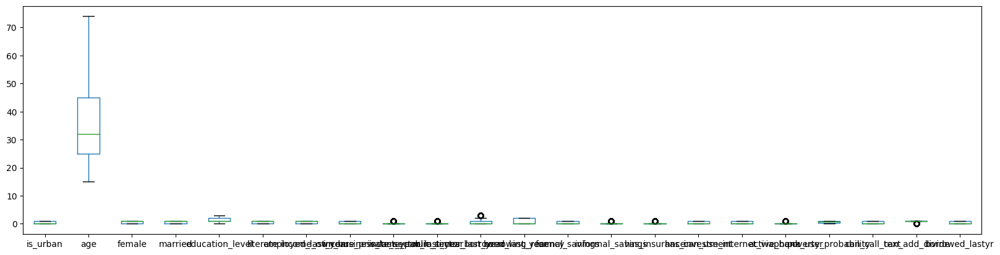

In [ ]:
plt.figure().set_figwidth(20)
fe1.boxplot(grid=False)

median poverty per country

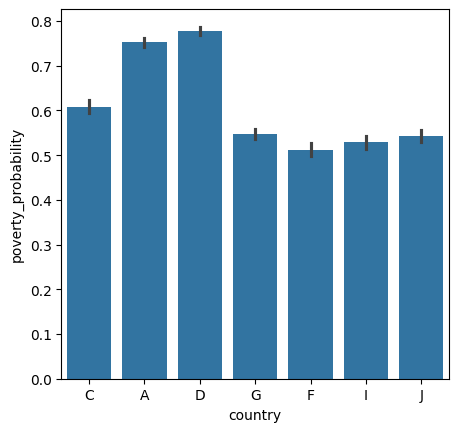

In [ ]:
med_country = fe1.groupby('country')['poverty_probability'].mean().sort_values()
plt.figure().set_figwidth(5)
sns.barplot(data=fe1 , x='country', y='poverty_probability')
plt.xticks(rotation=360)
plt.show()

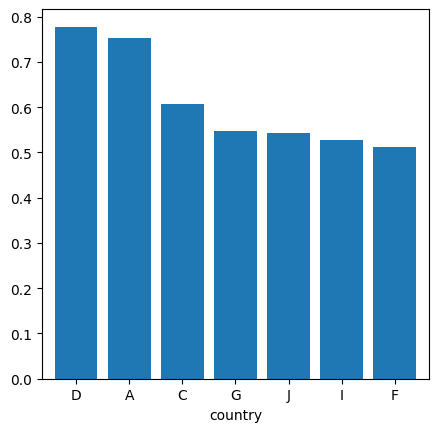

In [ ]:
med_country = fe1.groupby('country')['poverty_probability'].mean().sort_values(ascending=False)
plt.figure().set_figwidth(5)
med_country.plot(kind='bar', width=0.8)
plt.xticks(rotation=360)
plt.show()

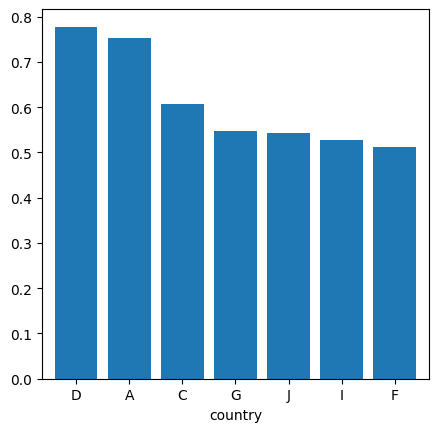

In [ ]:
med_country = fe1.groupby('country')['poverty_probability'].mean().sort_values(ascending=False)
plt.figure().set_figwidth(5)
med_country.plot(kind='bar', width=0.8)
plt.xticks(rotation=360)
plt.show()

<Axes: >

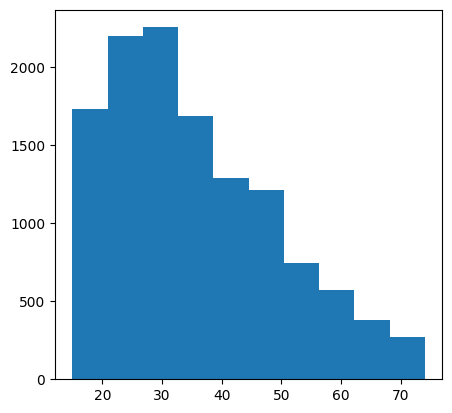

In [ ]:
plt.figure().set_figwidth(5)
fe1.age.hist(grid=False)

In [ ]:
log_age = fe1.copy()

In [ ]:
log_age['log_age'] = np.log(log_age['age'])
log_age.head()

,country,is_urban,age,female,married,religion,relationship_to_hh_head,education_level,literate,employed_last_year,...,informal_savings,has_insurance,has_investment,can_use_internet_viaphone,active_bank_user,poverty_probability,can_call_text,can_add_divide,borrowed_lastyr,log_age
0,C,False,18,True,True,P,Other,1.0,True,False,...,False,False,False,False,True,0.515,True,True,False,2.890372
1,C,True,30,True,True,P,Other,1.0,True,False,...,False,False,False,False,True,0.981,False,True,False,3.401197
2,A,False,20,True,True,Q,Spouse,1.0,True,True,...,False,False,False,False,False,0.982,False,True,False,2.995732
3,A,False,61,False,True,Q,Head,0.0,False,True,...,False,False,False,False,False,0.879,False,True,False,4.110874
4,D,False,26,True,True,X,Spouse,1.0,True,False,...,False,False,False,False,False,0.796,True,False,False,3.258097


<Axes: >

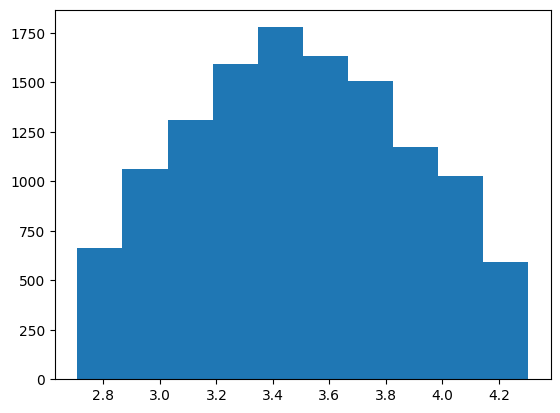

In [ ]:
log_age.log_age.hist(grid=False)

Text(0.5, 1.0, 'Distribution of age (log)')

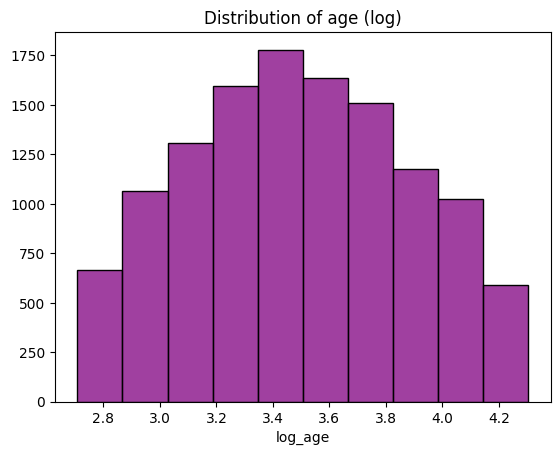

In [ ]:
sns.histplot(data=log_age, x='log_age', color='purple', bins=10, legend=False)
plt.ylabel('')
plt.title('Distribution of age (log)')

In [ ]:
import scipy.stats as stats

In [ ]:
skewness = stats.skew(log_age['log_age'])
print(f'                Skewness: {skewness: .5f}')

                Skewness:  0.02196


In [ ]:
log_age.drop(['age'], axis=1, inplace=True)
log_age.head()

,country,is_urban,female,married,religion,relationship_to_hh_head,education_level,literate,employed_last_year,employment_category_last_year,...,informal_savings,has_insurance,has_investment,can_use_internet_viaphone,active_bank_user,poverty_probability,can_call_text,can_add_divide,borrowed_lastyr,log_age
0,C,False,True,True,P,Other,1.0,True,False,housewife_or_student,...,False,False,False,False,True,0.515,True,True,False,2.890372
1,C,True,True,True,P,Other,1.0,True,False,housewife_or_student,...,False,False,False,False,True,0.981,False,True,False,3.401197
2,A,False,True,True,Q,Spouse,1.0,True,True,employed,...,False,False,False,False,False,0.982,False,True,False,2.995732
3,A,False,False,True,Q,Head,0.0,False,True,employed,...,False,False,False,False,False,0.879,False,True,False,4.110874
4,D,False,True,True,X,Spouse,1.0,True,False,housewife_or_student,...,False,False,False,False,False,0.796,True,False,False,3.258097


In [ ]:
dummy = pd.get_dummies(log_age)
dummy.head()

,is_urban,female,married,education_level,literate,employed_last_year,income_own_business_last_year,income_private_sector_last_year,income_public_sector_last_year,num_times_borrowed_last_year,...,employment_category_last_year_employed,employment_category_last_year_housewife_or_student,employment_category_last_year_other,employment_category_last_year_retired_or_disabled,employment_category_last_year_unemployed,employment_type_last_year_irregular_seasonal,employment_type_last_year_not_working,employment_type_last_year_other,employment_type_last_year_salaried,employment_type_last_year_self_employed
0,False,True,True,1.0,True,False,False,False,False,0,...,False,True,False,False,False,False,True,False,False,False
1,True,True,True,1.0,True,False,False,False,False,0,...,False,True,False,False,False,False,True,False,False,False
2,False,True,True,1.0,True,True,False,False,False,1,...,True,False,False,False,False,True,False,False,False,False
3,False,False,True,0.0,False,True,False,False,False,0,...,True,False,False,False,False,False,False,False,False,True
4,False,True,True,1.0,True,False,False,False,False,0,...,False,True,False,False,False,False,True,False,False,False


In [ ]:
corr = dummy.corr()

In [ ]:
plt.figure(figsize=(180, 100))
plt.rcParams['font.size'] = 50
sns.heatmap(corr, annot=True)

<Axes: >

those with high correl that can be removed:

*   employment category last year_employed & employed last yr
*   borrowing recency & num times borrowed last yr
*   employment type last yr_not working & employment cat last yr_housewife or student
*   employment type las yr_other & employment category last yr_other
*   religion p & country C



In [ ]:
dummy.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12344 entries, 0 to 12599
Data columns (total 51 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   is_urban                                            12344 non-null  bool   
 1   female                                              12344 non-null  bool   
 2   married                                             12344 non-null  bool   
 3   education_level                                     12344 non-null  float64
 4   literate                                            12344 non-null  bool   
 5   employed_last_year                                  12344 non-null  bool   
 6   income_own_business_last_year                       12344 non-null  bool   
 7   income_private_sector_last_year                     12344 non-null  bool   
 8   income_public_sector_last_year                      12344 non-null  bool   
 9   

In [ ]:
fe3 = dummy.drop(['employment_category_last_year_employed', 'num_times_borrowed_last_year', 'employment_category_last_year_housewife_or_student', 'employment_category_last_year_other', 'religion_P', 'relationship_to_hh_head_Unknown', 'relationship_to_hh_head_Other','employment_type_last_year_other'], axis=1)

In [ ]:
fe3.info()

<class 'pandas.core.frame.DataFrame'>
Index: 12344 entries, 0 to 12599
Data columns (total 43 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   is_urban                                           12344 non-null  bool   
 1   female                                             12344 non-null  bool   
 2   married                                            12344 non-null  bool   
 3   education_level                                    12344 non-null  float64
 4   literate                                           12344 non-null  bool   
 5   employed_last_year                                 12344 non-null  bool   
 6   income_own_business_last_year                      12344 non-null  bool   
 7   income_private_sector_last_year                    12344 non-null  bool   
 8   income_public_sector_last_year                     12344 non-null  bool   
 9   borrowing_r

In [ ]:
fe3['ppi'] = fe3['poverty_probability'].apply(lambda x: 1 if x > 0.60 else 0)
fe3.head()

,is_urban,female,married,education_level,literate,employed_last_year,income_own_business_last_year,income_private_sector_last_year,income_public_sector_last_year,borrowing_recency,...,relationship_to_hh_head_Sister/Brother,relationship_to_hh_head_Son/Daughter,relationship_to_hh_head_Spouse,employment_category_last_year_retired_or_disabled,employment_category_last_year_unemployed,employment_type_last_year_irregular_seasonal,employment_type_last_year_not_working,employment_type_last_year_salaried,employment_type_last_year_self_employed,ppi
0,False,True,True,1.0,True,False,False,False,False,0,...,False,False,False,False,False,False,True,False,False,0
1,True,True,True,1.0,True,False,False,False,False,0,...,False,False,False,False,False,False,True,False,False,1
2,False,True,True,1.0,True,True,False,False,False,2,...,False,False,True,False,False,True,False,False,False,1
3,False,False,True,0.0,False,True,False,False,False,0,...,False,False,False,False,False,False,False,False,True,1
4,False,True,True,1.0,True,False,False,False,False,0,...,False,False,True,False,False,False,True,False,False,1


<ipython-input-53-c78a58755eeb>:2: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:purple'` for the same effect.

  sns.countplot(fe3, x='ppi', hue='ppi', color='purple', legend=False)


<Axes: xlabel='ppi', ylabel='count'>

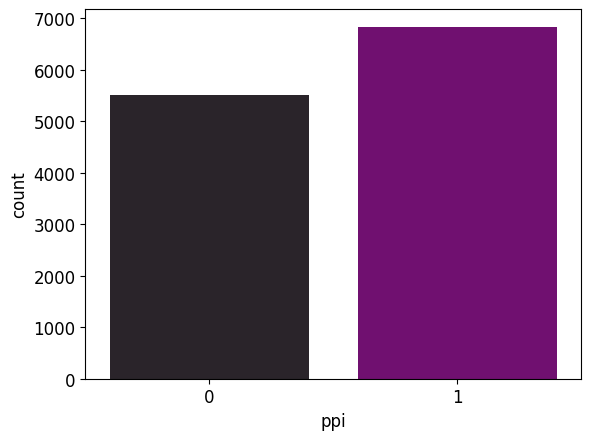

In [ ]:
plt.rcParams['font.size'] = 12
sns.countplot(fe3, x='ppi', hue='ppi', color='purple', legend=False)

Upsampling

In [ ]:
from sklearn.utils import resample

#create two different dataframe of majority and minority class
fe3_majority = fe3[(fe3['ppi'] == 1)]
fe3_minority = fe3[(fe3['ppi'] == 0)]

# upsample minority class
fe3_minority_upsampled = resample(fe3_minority,
                                 replace=True,    # sample with replacement
                                 n_samples= len(fe3_majority), # to match majority class
                                 random_state=10)  # reproducible results

# Combine majority class with upsampled minority class
fe4 = pd.concat([fe3_minority_upsampled, fe3_majority])

<ipython-input-55-1cefb137bc1e>:1: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:purple'` for the same effect.

  sns.countplot(fe4, x='ppi', hue='ppi', color='purple', legend=False)


Text(0.5, 1.0, 'Upsampled data')

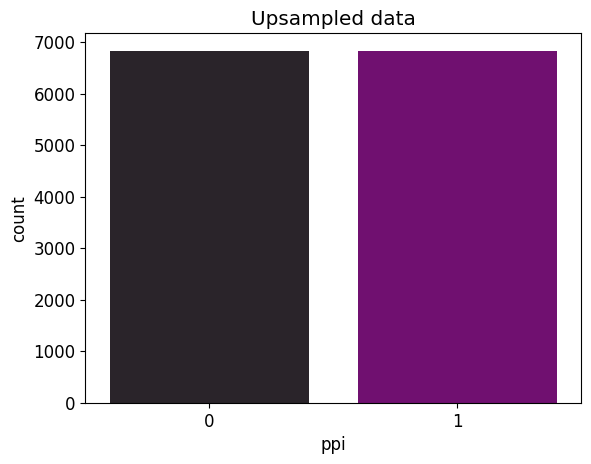

In [ ]:
sns.countplot(fe4, x='ppi', hue='ppi', color='purple', legend=False)
plt.title('Upsampled data')

In [ ]:
#define x and y

X = fe4.drop(['poverty_probability', 'ppi'], axis=1)
y = fe4['ppi']

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.preprocessing import StandardScaler, MinMaxScaler

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30,
                                                    random_state=10)

print("Number of training samples:", X_train.shape)
print("Number of testing samples:", X_test.shape)

Number of training samples: (9569, 42)
Number of testing samples: (4101, 42)


In [ ]:
#perform logistic regression

logmodel = LogisticRegression()
logmodel.fit(X_train,y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [ ]:
predictions = logmodel.predict(X_test)

In [ ]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.72      0.72      0.72      2050
           1       0.72      0.72      0.72      2051

    accuracy                           0.72      4101
   macro avg       0.72      0.72      0.72      4101
weighted avg       0.72      0.72      0.72      4101



In [ ]:
train_score = logmodel.score(X_train, y_train)
print(f'Train score of trained model: {train_score*100}')

test_score = logmodel.score(X_test, y_test)
print(f'Test score of test model: {test_score*100}')

Train score of trained model: 72.5676664228237
Test score of test model: 72.17751767861498


<Axes: >

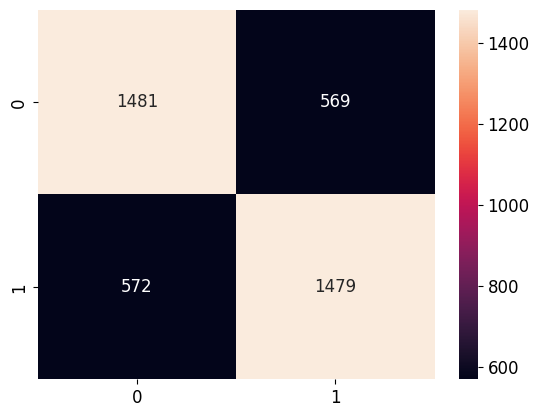

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_test, predictions)
sns.heatmap(cm, annot=True, fmt='g', color='purple')

In [ ]:
from sklearn.model_selection import GridSearchCV

# Set Up LogisticRegression Model
logmodel = LogisticRegression()

# Set Up Parameter Grid for Grid Search
param_grid = {
    'C': [100, 10, 1.0, 0.1, 0.01],
    'penalty': ['l1', 'l2'],
    'solver': [ 'liblinear', 'saga']}

# Perform Grid Search Cross-Validation
grid_search = GridSearchCV(logmodel, param_grid, cv=5, verbose = 2, n_jobs = -1)
grid_search.fit(X_train, y_train)

# Fit the Model with Best Parameters and Evaluate
best_model = grid_search.best_estimator_
best_params = grid_search.best_params_

print(f'GridSearchView Best Score: {grid_search.best_score_*100}')
print(f'GridSearchView Best Params: {grid_search.best_params_}')

Fitting 5 folds for each of 20 candidates, totalling 100 fits
GridSearchView Best Score: 72.2540982039513
GridSearchView Best Params: {'C': 1.0, 'penalty': 'l1', 'solver': 'saga'}


In [ ]:
train_score_b = best_model.score(X_train, y_train)
print(f'Train score of trained model: {train_score_b*100}')

test_score_b = best_model.score(X_test, y_test)
print(f'Test score of test model: {test_score_b*100}')

Train score of trained model: 72.50496394607588
Test score of test model: 72.22628627164106


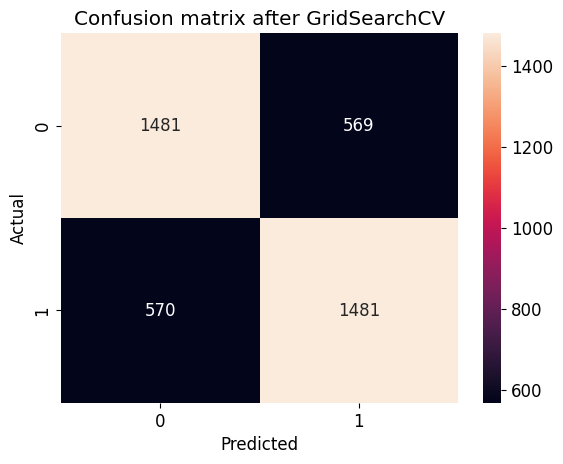

In [ ]:
grid_predictions = grid_search.predict(X_test)

cm = confusion_matrix(y_test, grid_predictions)
sns.heatmap(cm, annot=True, fmt='g')
plt.title('Confusion matrix after GridSearchCV')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Feature importance

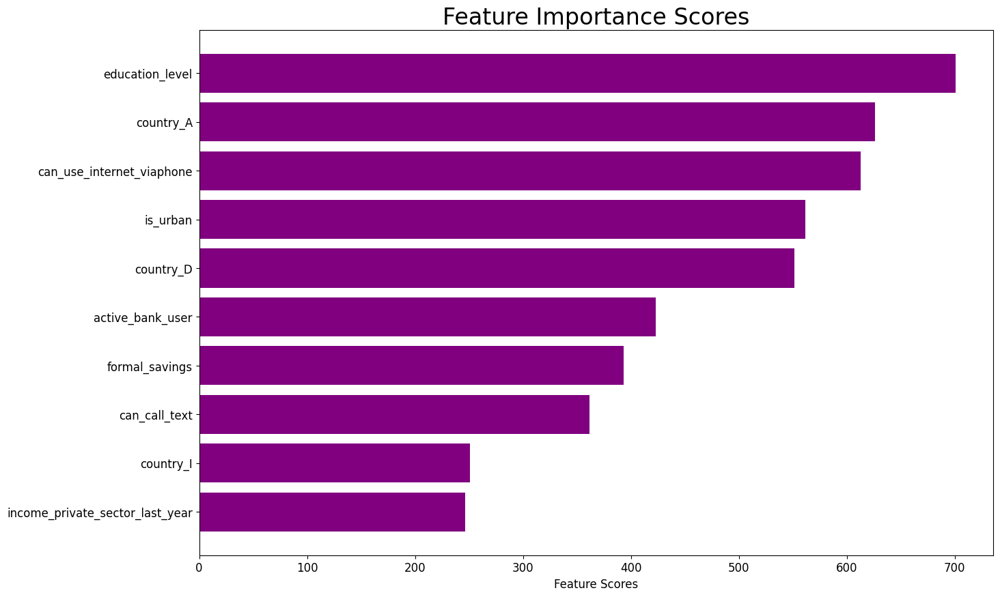

Features in Order of Importance:
education_level: 700.6646674231372
country_A: 626.1704109589041
can_use_internet_viaphone: 612.7069922308546
is_urban: 561.8549650645776
country_D: 551.4054054054054
active_bank_user: 423.2592087312415
formal_savings: 393.4214816590746
can_call_text: 361.49487375669474
country_I: 250.65285226718674
income_private_sector_last_year: 246.67777777777778
employment_type_last_year_salaried: 190.6437246963563
literate: 142.52655538694992
employment_type_last_year_irregular_seasonal: 141.28123744475693
has_investment: 137.6715157203191
country_G: 133.57771114442778
income_public_sector_last_year: 112.4745417515275
informal_savings: 78.30367346938776
income_own_business_last_year: 75.05866921058907
country_J: 72.90949335956714
religion_Q: 71.12754316977261
religion_X: 70.7182320441989
country_F: 68.65077720207253
has_insurance: 47.071150639244024
married: 42.97523008749006
borrowing_recency: 40.62381916329285
relationship_to_hh_head_Spouse: 21.01716927140656
rel

In [ ]:
from sklearn.feature_selection import SelectKBest, chi2
import matplotlib.pyplot as plt

# Here, we select the top 2 features based on chi-squared statistical test
select_k_best = SelectKBest(chi2, k=2)
features_new = select_k_best.fit_transform(X, y)

# Get the feature scores
feature_scores = select_k_best.scores_
feature_names = X.columns

# Create a dictionary to map feature names to theiACr scores
feature_scores_dict = {feature_name: score for feature_name, score in zip(X.columns, feature_scores)}


# Sort features by their scores in descending order
sorted_features = sorted(feature_scores_dict, key=feature_scores_dict.get, reverse=True)
sorted_scores = [feature_scores_dict[feature] for feature in sorted_features]


# Create a bar plot to visualize the feature scores with highest value on top
plt.figure(figsize=(15, 10))
plt.barh(sorted_features[:10], sorted_scores[:10], color='purple', align='center')
plt.rcParams['font.size'] = 20
plt.xlabel('Feature Scores')
plt.title('Feature Importance Scores')
plt.gca().invert_yaxis()  # Invert the y-axis for highest score on top
plt.show()

# Print the features in order of importance
print("Features in Order of Importance:")
for feature in sorted_features:
    print(f"{feature}: {feature_scores_dict[feature]}")

In [ ]:
#plot tope features using other classifiers

from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier()
model.fit(X, y)

importances = model.feature_importances_

# Sort features by importance (descending order)
feature_names = X.columns  # Assuming feature names are in the columns
sorted_idx = np.argsort(importances)[::-1]

# Get top 10 features
top_10_features = feature_names[sorted_idx[:10]]
top_10_importances = importances[sorted_idx[:10]]

# Print the top 10 most important features
print("Top 10 Predictors:")
for i, feature in enumerate(top_10_features):
    print(f"{i+1}. {feature} (Importance: {top_10_importances[i]:.4f})")

Top 10 Predictors:
1. log_age (Importance: 0.1831)
2. education_level (Importance: 0.0827)
3. is_urban (Importance: 0.0465)
4. country_A (Importance: 0.0370)
5. country_D (Importance: 0.0365)
6. borrowing_recency (Importance: 0.0327)
7. can_use_internet_viaphone (Importance: 0.0314)
8. can_call_text (Importance: 0.0297)
9. formal_savings (Importance: 0.0266)
10. literate (Importance: 0.0247)


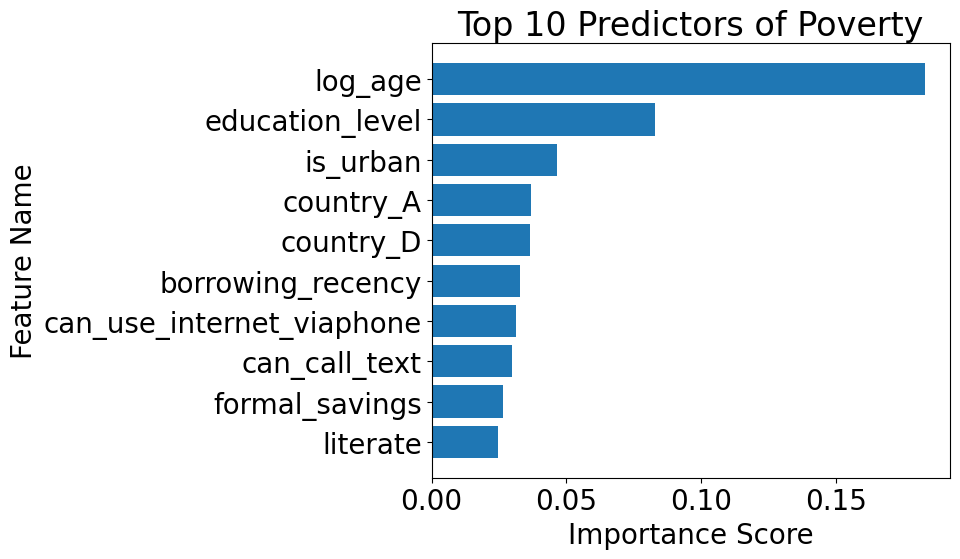

In [ ]:
plt.figure(figsize=(10, 6))
plt.barh(top_10_features, top_10_importances)
plt.xlabel("Importance Score")
plt.ylabel("Feature Name")
plt.title("Top 10 Predictors of Poverty")
plt.gca().invert_yaxis()  # Invert y-axis to display top features at the top
plt.tight_layout()
plt.show()

In [ ]:
from sklearn.feature_selection import RFE

#from sklearn.linear_model import LogisticRegression

# Assuming 'features' is your DataFrame with all features and 'target' is your target variable
# Initialize logistic regression model
#model = LogisticRegression()

# Initialize RFE with the logistic regression model and number of features to select
# Selecting top 5 features for a more informative graph

rfe = RFE(estimator=logmodel, n_features_to_select=1)
# Fit RFE to the data
rfe.fit(X, y)

# Get the ranking of all features (1 is best)
feature_ranking = rfe.ranking_

# Get the names of all features
feature_names = X.columns

# Create a dictionary to map feature names to their rankings
feature_ranking_dict = {name: rank for name, rank in zip(feature_names, feature_ranking)}

# Sort features by their rankings in ascending order (best features first)
sorted_features = sorted(feature_ranking_dict, key=feature_ranking_dict.get)
sorted_ranks = [feature_ranking_dict[feature] for feature in sorted_features]

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

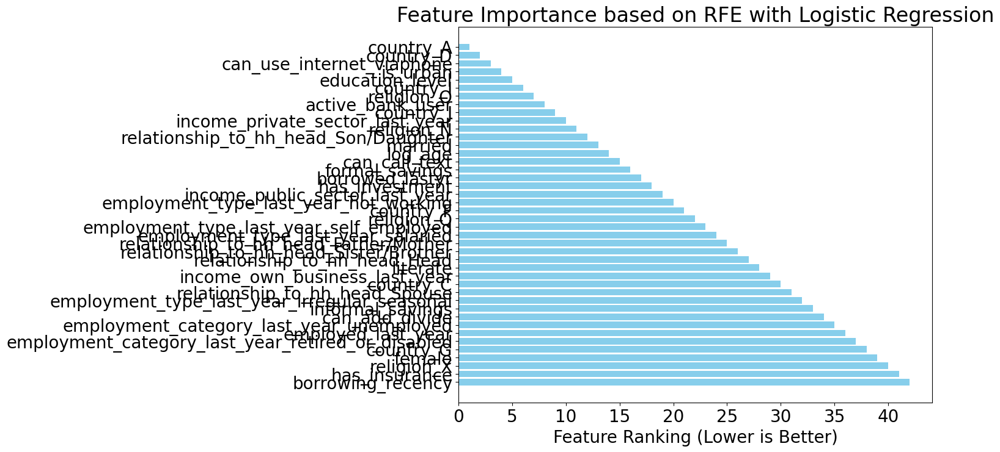

Top 10 Features:
country_A (Rank: 1)
country_D (Rank: 2)
can_use_internet_viaphone (Rank: 3)
is_urban (Rank: 4)
education_level (Rank: 5)
country_I (Rank: 6)
religion_O (Rank: 7)
active_bank_user (Rank: 8)
country_J (Rank: 9)
income_private_sector_last_year (Rank: 10)


In [ ]:
# Create a bar plot to visualize feature rankings
plt.figure(figsize=(10, 8))
plt.barh(sorted_features, sorted_ranks, color='skyblue')
plt.xlabel('Feature Ranking (Lower is Better)')
plt.title('Feature Importance based on RFE with Logistic Regression')
plt.gca().invert_yaxis()  # Invert y-axis for best features on top
plt.show()

# Print the top 5 features
top_10_features = sorted_features[:10]
print("Top 10 Features:")
for feature in top_10_features:
    print(f"{feature} (Rank: {feature_ranking_dict[feature]})")

In [ ]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

# Assuming X is your feature matrix and y is your target variable

# Create an RFE object with a desired number of features
rfe = RFE(estimator=LogisticRegression(), n_features_to_select=7)

# Fit the RFE object to your data
rfe.fit(X, y)

# Get the selected features
selected_features = X.columns[rfe.support_]

# Create a new dataset with selected features
X_new = X[selected_features]

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

In [ ]:
X_new

,is_urban,education_level,can_use_internet_viaphone,country_A,country_D,country_I,religion_O
2925,True,1.0,False,False,False,False,False
10497,False,1.0,False,False,False,True,False
3055,False,2.0,False,False,False,False,False
7809,True,0.0,False,False,False,True,False
2670,True,1.0,False,False,False,False,False
...,...,...,...,...,...,...,...
12592,False,0.0,False,False,False,True,False
12593,False,0.0,False,False,False,False,False
12594,False,1.0,False,True,False,False,False
12595,True,1.0,False,False,False,False,False


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_new, y, test_size=0.30,
                                                    random_state=10)

print("Number of training samples:", X_train.shape)
print("Number of testing samples:", X_test.shape)

Number of training samples: (9569, 7)
Number of testing samples: (4101, 7)


In [ ]:
logmodel.fit(X_train,y_train)
predictions = logmodel.predict(X_test)
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.71      0.70      0.71      2050
           1       0.71      0.71      0.71      2051

    accuracy                           0.71      4101
   macro avg       0.71      0.71      0.71      4101
weighted avg       0.71      0.71      0.71      4101



In [ ]:

train_score = logmodel.score(X_train, y_train)
print(f'Train score of trained model: {train_score*100}')

test_score = logmodel.score(X_test, y_test)
print(f'Test score of test model: {test_score*100}')

Train score of trained model: 71.18821193437141
Test score of test model: 70.76322848085833


<Axes: >

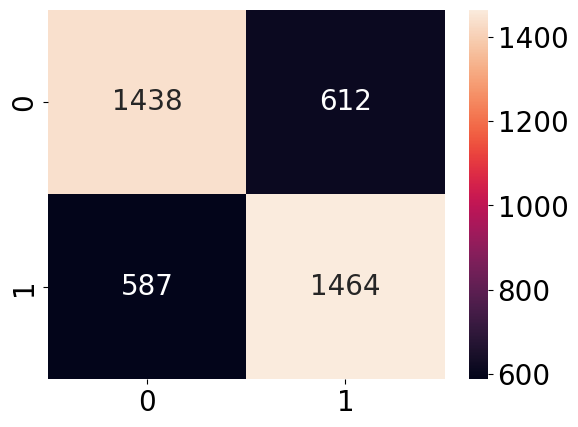

In [ ]:
cm1 = confusion_matrix(y_test, predictions)
sns.heatmap(cm1, annot=True, fmt='g', color='purple')

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30,
                                                    random_state=10)

print("Number of training samples:", X_train.shape)
print("Number of testing samples:", X_test.shape)

Number of training samples: (9569, 42)
Number of testing samples: (4101, 42)


In [ ]:
rf = RandomForestClassifier(n_estimators=100, random_state=10)
rf.fit(X_train, y_train)

RandomForestClassifier(random_state=10)

In [ ]:
y_pred = rf.predict(X_test)

In [ ]:
#Evaluate the model
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.80      0.86      0.83      2050
           1       0.85      0.78      0.81      2051

    accuracy                           0.82      4101
   macro avg       0.82      0.82      0.82      4101
weighted avg       0.82      0.82      0.82      4101



<Axes: >

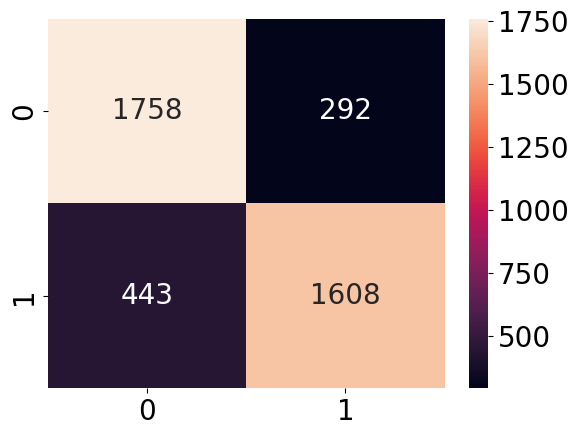

In [ ]:
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='g')